# Associative Dynamics in a Chaotic Neural Network
## Adachi, Aihara
Neural Networks 10, 1, 8348 (1997)

Model chaotycznego neuronu z czasem dyskretnym:
$$
x(t+1)=f[ A(t) - \alpha \sum \limits_{d=0}^t k^d g(x(t-d)) - \theta ]
$$

- $f(\ldots)$ - funkcja aktywacji
- $A(t)$ - zewnętrzna stymulacja
- $g(\ldots)$ - funkcja refrakcji
- $k$ - parametr zaniku refrakcji
- $\alpha$ - parametr zaniku refrakcji
- $\theta$ - próg aktywacji

W dalszych rozważaniach przyjęto:
- funkcja aktywacji $f(y) = \frac{1}{1+e^{-\frac{y}{\epsilon}}}$ (f-cja Fermiego)
- $g(x)=x$
- $A(t)-\theta = a$ - stałe pobudzenie


In [1]:
using Plots
# plotly()
gr()
default(leg=false, lw=2)

In [2]:
f(x,ϵ=0.015)=1/(1+exp(-x/ϵ))
aihara(y,a=0,k=0.9,α=1)=k*y-α*f(y) + a

aihara (generic function with 4 methods)

In [3]:
function run(param, steps=100, trans=1000)
    x=0.1
    for i in 1:trans
        x=aihara(x,param)
    end

    X=[]
    for i in 1:steps
        x=aihara(x,param)
        append!(X,x)
    end
    X
end

run (generic function with 3 methods)

In [4]:
X=[]
A=[]
for a=0.02:0.00005:0.05
# for a=0.02:0.0005:0.5  
    x=run(a,200)
    append!(X, x)
    append!(A, a*ones(length(x)))
end

scatter(A, X, alpha=0.5, markersize=0.1, markercolor=:black)
# savefig("aihara005.png")

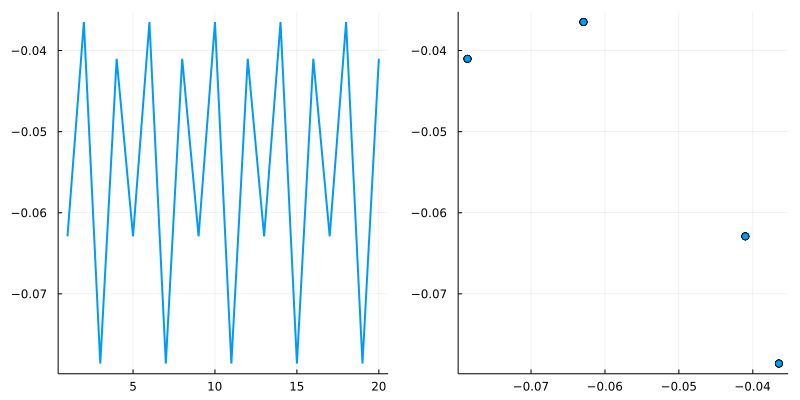

In [5]:
tt=1:1000
X=run(0.035)
p1=plot(X[1:20])
p2=scatter(X[1:end-1],X[2:end],alpha=0.3)
plot(p1, p2, size=(800,400))